# **Image Classification using Convolutional Neural Networks (CNNs)**

**Import necessary libraries**

In [ ]:
# import system libs
import os
import itertools

# import data handling tools
import numpy as np
import pandas as pd
import seaborn as sns
sns.set_style('darkgrid')
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report

# import Deep learning Libraries
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam, Adamax
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, GlobalAveragePooling2D, BatchNormalization
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

# ignore the warnings
import warnings
warnings.filterwarnings('ignore')

# **1.Data Exploration and Selection:**

**Dataset Link**: https://www.kaggle.com/datasets/alxmamaev/flowers-recognition

There are 4242 images on this dataset and there are five types of flowers that are predicted and trained on
*   Daisy
*   Dandelion
*   Rose
*   Sunflower
*   Tulip  
For each class there are about 800 photos. Photos are with the resolution, about 320x240 pixels.






### **Load and Explore the Dataset:**

In [ ]:
!pip install kaggle

**loading the dataset using Kaggle API and exploring the DataFrame structure**

In [ ]:
from google.colab import files
files.upload()  # Upload your Kaggle API token (kaggle.json)
!mkdir ~/.kaggle
!mv kaggle.json ~/.kaggle/
# Download and unzip the dataset directly from Kaggle
!kaggle datasets download -d alxmamaev/flowers-recognition
!unzip -q flowers-recognition.zip -d flowers_dataset

Saving kaggle.json to kaggle.json
 99% 222M/225M [00:10<00:00, 28.8MB/s]
100% 225M/225M [00:10<00:00, 22.3MB/s]


In [ ]:
import os
import pandas as pd

# Create an empty DataFrame to store image paths and labels
df = pd.DataFrame(columns=["image_path", "label"])

In [ ]:
# Path to the folder containing the images
data_path = "/content/flowers_dataset/flowers"

# List all the folders (categories) in the dataset
categories = os.listdir(data_path)

# Iterate through each category folder
for category in categories:
    # List all the image files in the category folder
    image_files = os.listdir(os.path.join(data_path, category))
    # Iterate through each image file in the category folder
    for image_file in image_files:
        # Construct the full path to the image file
        image_path = os.path.join(data_path, category, image_file)
        # Append the image path and its label to the DataFrame
        df = df.append({"image_path": image_path, "label": category}, ignore_index=True)


In [ ]:
df.shape

(4317, 2)

In [ ]:
# Display the DataFrame
df.head()

,image_path,label
0,/content/flowers_dataset/flowers/sunflower/195...,sunflower
1,/content/flowers_dataset/flowers/sunflower/935...,sunflower
2,/content/flowers_dataset/flowers/sunflower/274...,sunflower
3,/content/flowers_dataset/flowers/sunflower/595...,sunflower
4,/content/flowers_dataset/flowers/sunflower/274...,sunflower


In [ ]:
# Display the last 5 rows of the DataFrame
df.tail()

,image_path,label
4312,/content/flowers_dataset/flowers/rose/19027407...,rose
4313,/content/flowers_dataset/flowers/rose/38840529...,rose
4314,/content/flowers_dataset/flowers/rose/15184419...,rose
4315,/content/flowers_dataset/flowers/rose/46127667...,rose
4316,/content/flowers_dataset/flowers/rose/15333843...,rose


**Display sample image for each class**

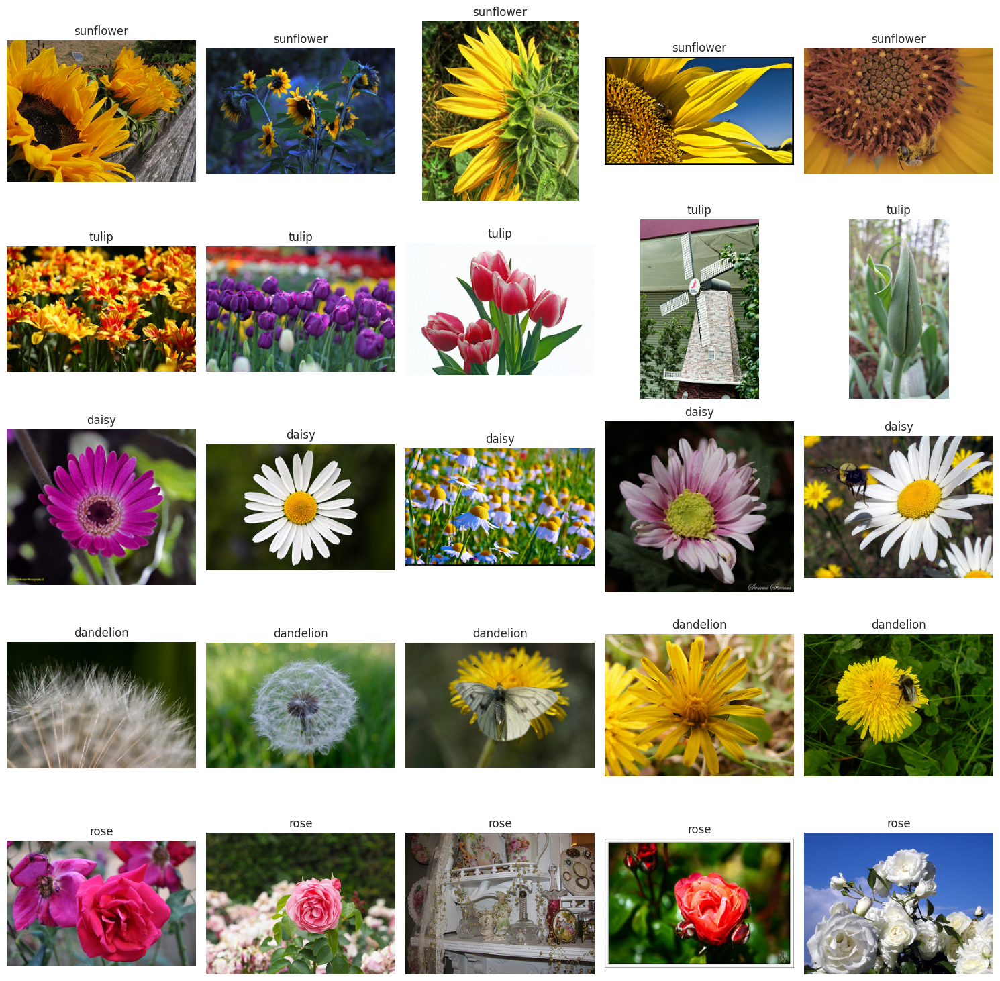

In [ ]:
import random
# Display sample images from each class
num_samples_per_class = 5
fig, axs = plt.subplots(len(categories), num_samples_per_class, figsize=(15, 15))

for i, class_label in enumerate(categories):
    class_images = df[df['label'] == class_label]['image_path'].tolist()
    sampled_images = random.sample(class_images, num_samples_per_class)

    for j, image_path in enumerate(sampled_images):
        img = plt.imread(image_path)
        axs[i, j].imshow(img)
        axs[i, j].set_title(class_label)
        axs[i, j].axis('off')

plt.tight_layout()
plt.show()

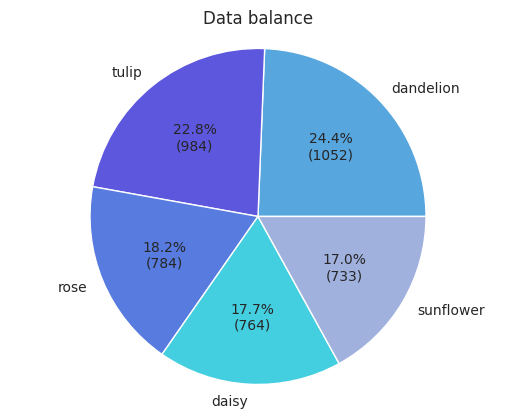

In [ ]:
import matplotlib.pyplot as plt
data_balance = df.label.value_counts()

def custom_autopct(pct):
    total = sum(data_balance)
    val = int(round(pct*total/100.0))
    return "{:.1f}%\n({:d})".format(pct, val)

# pie chart for data balance
plt.pie(data_balance, labels = data_balance.index, autopct=custom_autopct, colors = ["#57A6DE","#5D57DE","#577BDE","#43CFE0","#A0B1DE"])
plt.title("Data balance")
plt.axis("equal")
plt.show()

Flower counts for each class, almsot nearby,  , proceed with preprocessing of data

# **2.	Data Preprocessing:**

**Splitting the Dataset**: Splitting the dataset into training, validation, and test sets with appropriate proportions is essential for model evaluation.

train_df: 80% of the original dataset for training.  
valid_df: 10% of the original dataset for validation.  
test_df: 10% of the original dataset for testing.  

In [ ]:
# data --> 80% train data && 20% (test, val)
train_df, ts_df = train_test_split(df, train_size = 0.8, shuffle = True, random_state = 42)

# test data --> 10% train data && 10% (test, val)
valid_df, test_df = train_test_split(ts_df, train_size = 0.5, shuffle = True, random_state = 42)

**Data augmentation**

In [ ]:
# Data Augmentation
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest')

**Image Resizing and Normalization**

In [ ]:
# Image Resizing and Normalization
valid_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

In [ ]:
# Batch Size
batch_size = 32

# Training Data Generator
train_generator = train_datagen.flow_from_dataframe(
    dataframe=train_df,
    x_col="image_path",
    y_col="label",
    target_size=(320, 240),
    batch_size=batch_size,
    class_mode='categorical')

Found 3453 validated image filenames belonging to 5 classes.


In [ ]:
# Validation Data Generator
valid_generator = valid_datagen.flow_from_dataframe(
    dataframe=valid_df,
    x_col="image_path",
    y_col="label",
    target_size=(320, 240),
    batch_size=batch_size,
    class_mode='categorical')


Found 432 validated image filenames belonging to 5 classes.


In [ ]:
test_generator = test_datagen.flow_from_dataframe(
    dataframe=test_df,
    x_col="image_path",
    y_col="label",
    target_size=(320, 240),
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False)

Found 432 validated image filenames belonging to 5 classes.


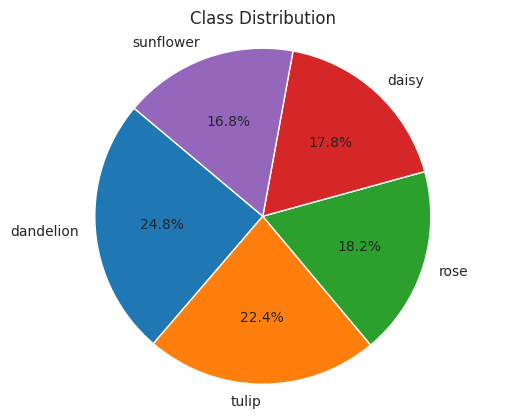

In [ ]:
# Ensure class balance
data_balance = train_df['label'].value_counts()

# Display class distribution
plt.pie(data_balance, labels=data_balance.index, autopct='%1.1f%%', startangle=140)
plt.title('Class Distribution')
plt.axis('equal')
plt.show()

Display 5 samples from each class

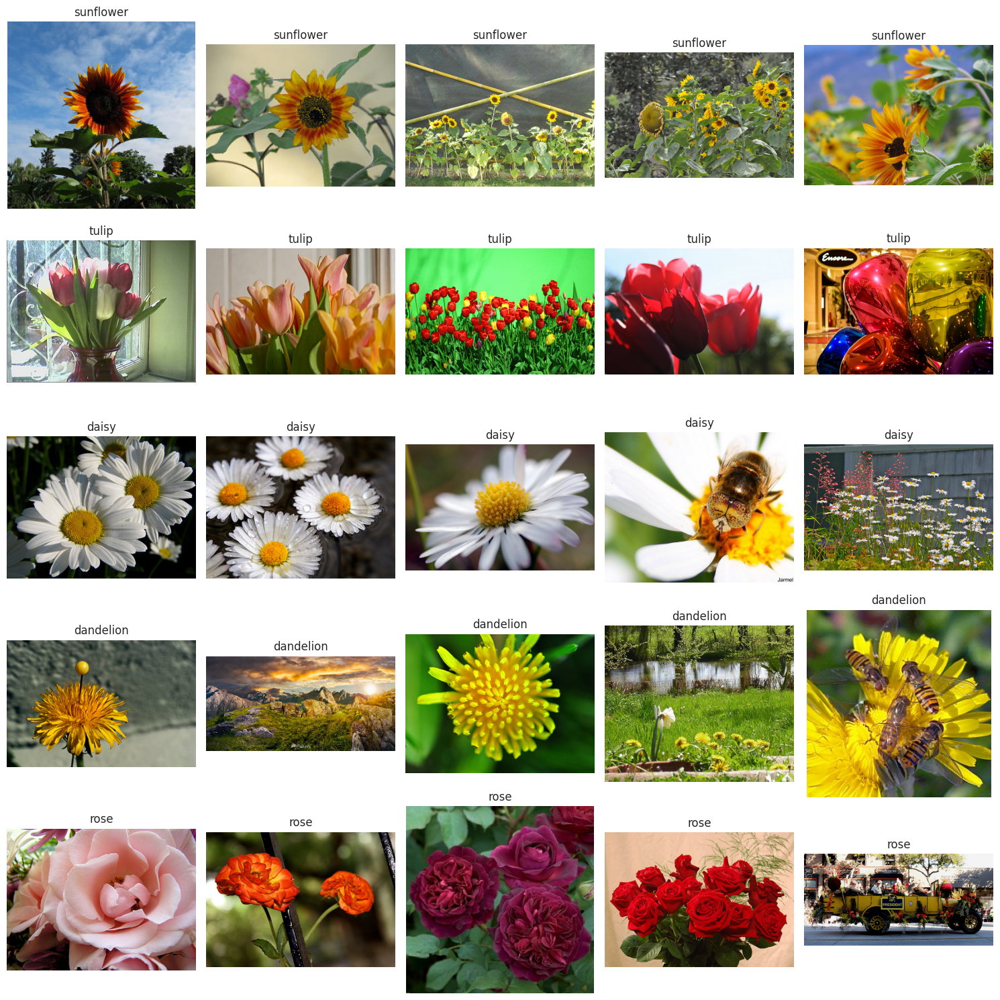

In [ ]:
import random

# Define the number of samples to display from each class
num_samples_per_class = 5

# Get unique classes
classes = df['label'].unique()

# Create a subplot grid
fig, axs = plt.subplots(len(classes), num_samples_per_class, figsize=(15, 15))

# Iterate through each class
for i, class_label in enumerate(classes):
    # Filter dataframe to get images of the current class
    class_images = df[df['label'] == class_label]['image_path'].tolist()

    # Randomly select num_samples_per_class images
    sampled_images = random.sample(class_images, num_samples_per_class)

    # Plot the sampled images for the current class
    for j, image_path in enumerate(sampled_images):
        img = plt.imread(image_path)
        axs[i, j].imshow(img)
        axs[i, j].set_title(class_label)
        axs[i, j].axis('off')

plt.tight_layout()
plt.show()


# **3. Model Building:**

**Defining Model Architecture:**

**Total Layers:**

Convolutional Layers: 3  
MaxPooling Layers: 3  
Dense Layers: 2  
Dropout Layers: 1   
Output Layer: 1  
So, the total number of layers in the model is
3 (Convolutional) + 3 (MaxPooling) + 2 (Dense) + 1 (Dropout) + 1 (Output) = **10 layers**.

In [ ]:
# Define CNN model architecture
model = Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=(320, 240, 3)),
    MaxPooling2D(pool_size=(2, 2)),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D(pool_size=(2, 2)),
    Conv2D(128, (3, 3), activation='relu'),
    MaxPooling2D(pool_size=(2, 2)),
    Flatten(),
    Dense(128, activation='relu'),
    Dropout(0.5),
    Dense(5, activation='softmax')
])


In [ ]:
# Compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Display model summary
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 318, 238, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2  (None, 159, 119, 32)      0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 157, 117, 64)      18496     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 78, 58, 64)        0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 76, 56, 128)       73856     
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 38, 28, 128)       0

# **4. Training the Model:**

In [ ]:
# Define callbacks
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=3, min_lr=0.000001, verbose=1)

# Train the model
history = model.fit(
    train_generator,
    steps_per_epoch=len(train_generator),
    epochs=20,
    validation_data=valid_generator,
    validation_steps=len(valid_generator),
    callbacks=[early_stopping, reduce_lr])


Epoch 1/20
108/108 [==============================] - 63s 524ms/step - loss: 1.5018 - accuracy: 0.3913 - val_loss: 1.1541 - val_accuracy: 0.5139 - lr: 0.0010
Epoch 2/20
108/108 [==============================] - 57s 528ms/step - loss: 1.2323 - accuracy: 0.4732 - val_loss: 1.0447 - val_accuracy: 0.5833 - lr: 0.0010
Epoch 3/20
108/108 [==============================] - 58s 535ms/step - loss: 1.1341 - accuracy: 0.5352 - val_loss: 1.0098 - val_accuracy: 0.5926 - lr: 0.0010
Epoch 4/20
108/108 [==============================] - 57s 527ms/step - loss: 1.0654 - accuracy: 0.5676 - val_loss: 0.9749 - val_accuracy: 0.6134 - lr: 0.0010
Epoch 5/20
108/108 [==============================] - 57s 528ms/step - loss: 1.0133 - accuracy: 0.5922 - val_loss: 0.9140 - val_accuracy: 0.6273 - lr: 0.0010
Epoch 6/20
108/108 [==============================] - 57s 527ms/step - loss: 0.9742 - accuracy: 0.6212 - val_loss: 0.9056 - val_accuracy: 0.6690 - lr: 0.0010
Epoch 7/20
108/108 [==============================] 

**Visualize training and validation loss**

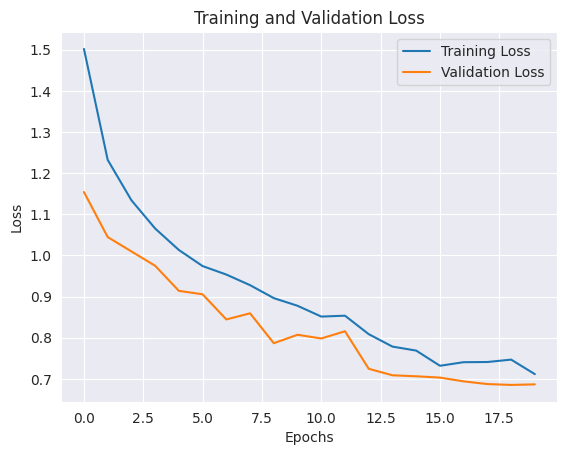

In [ ]:
# Plot training and validation loss
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.show()

**Visualize training and validation Accuracy**

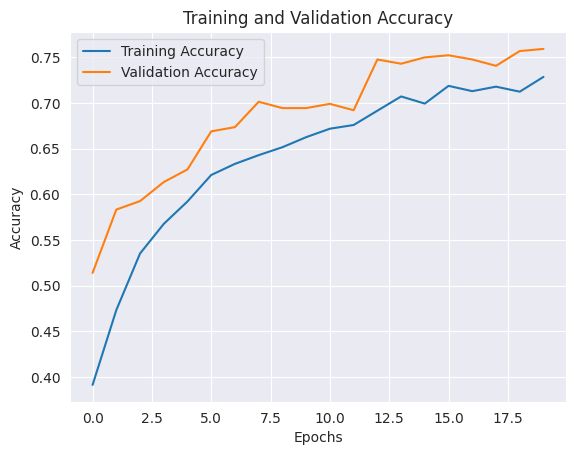

In [ ]:
# Plot training and validation accuracy
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()
plt.show()

# **5. Evaluation:**

**Evaluation of the model on the test set**

In [ ]:
# Evaluate the model on the test set
loss, accuracy = model.evaluate(test_generator, steps=len(test_generator))
print("Test Loss:", loss)
print("Test Accuracy:", accuracy)

14/14 [==============================] - 1s 81ms/step - loss: 0.7550 - accuracy: 0.7407
Test Loss: 0.7549704313278198
Test Accuracy: 0.7407407164573669


**Calculate Metrices**

In [ ]:
# Generate predictions
predictions = model.predict(test_generator)
predicted_classes = np.argmax(predictions, axis=1)
# Get true labels
true_classes = test_generator.classes

# Calculate evaluation metrics
print(classification_report(true_classes, predicted_classes))

14/14 [==============================] - 1s 82ms/step
              precision    recall  f1-score   support

           0       0.77      0.73      0.75        84
           1       0.80      0.76      0.78       101
           2       0.61      0.65      0.63        71
           3       0.74      0.93      0.82        72
           4       0.76      0.66      0.71       104

    accuracy                           0.74       432
   macro avg       0.74      0.75      0.74       432
weighted avg       0.74      0.74      0.74       432



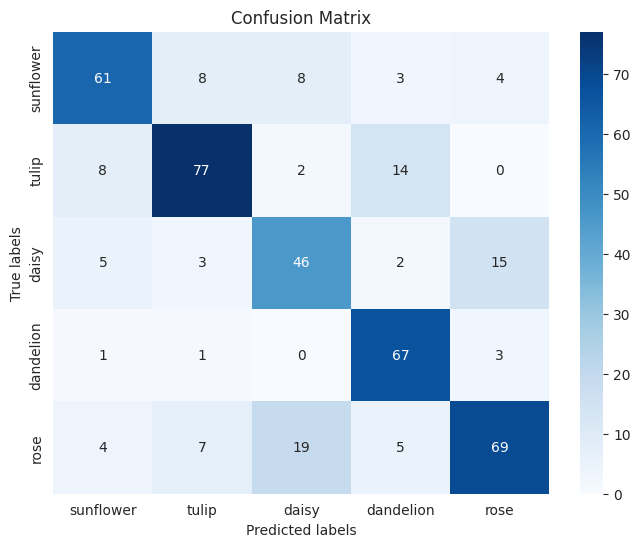

In [ ]:
# Generate confusion matrix
conf_matrix = confusion_matrix(true_classes, predicted_classes)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=categories, yticklabels=categories)
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix')
plt.show()

14/14 [==============================] - 1s 90ms/step


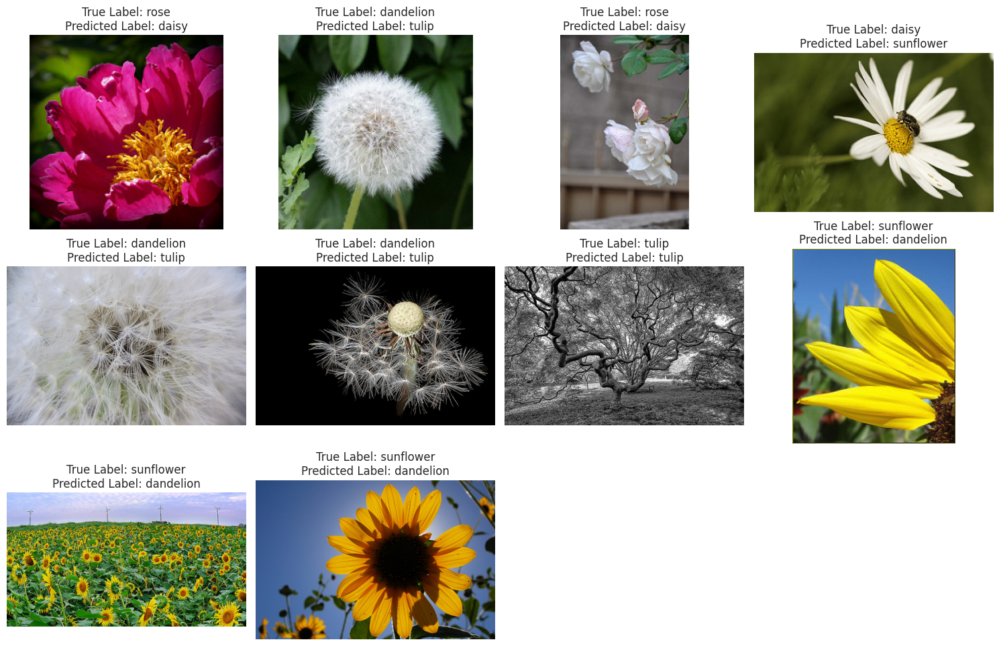

In [ ]:
# Use the trained model to predict classes for the test set
predictions = model.predict(test_generator)
predicted_classes = np.argmax(predictions, axis=1)

# Display a few sample predictions
plt.figure(figsize=(15, 10))
for i in range(10):  # Adjust the number of samples as needed
    index = np.random.randint(len(test_df))  # Select a random index from the test dataset
    img_path = test_df.iloc[index]['image_path']
    true_label = test_df.iloc[index]['label']
    predicted_label = categories[predicted_classes[index]]

    img = plt.imread(img_path)
    plt.subplot(3, 4, i + 1)
    plt.imshow(img)
    plt.title(f"True Label: {true_label}\nPredicted Label: {predicted_label}")
    plt.axis('off')
plt.tight_layout()
plt.show()
